# Variational Autoencoder (VAE)

Useful links: 
* Original paper http://arxiv.org/abs/1312.6114
* Helpful videos explaining the topic 
   * https://www.youtube.com/watch?v=P78QYjWh5sM     
   * http://videolectures.net/deeplearning2015_courville_autoencoder_extension/?q=aaron%20courville

### Download data

In [1]:
#!L
from yfile import download_from_yadisk
import os

TARGET_DIR = '.'
FILENAME = "celeba.zip"

if not os.path.exists(os.path.join(TARGET_DIR, FILENAME)):
    # we are going to download 1.4 gb file, downloading will take some time (8-10 minutes)
    download_from_yadisk(
        short_url='https://disk.yandex.ru/d/QErNx-MoC-2Y6Q',
        filename=FILENAME,
        target_dir=TARGET_DIR
    )

    # alternative way: 
    #from gfile import download_list
    #download_list(url=https://drive.google.com/file/d/1lwn2JMwWNGloGvyzKUOcewT8JqP1ICoW,
    #               filename=FILENAME, target_dir=TARGET_DIR)

filesize = os.path.getsize(os.path.join(TARGET_DIR, FILENAME))
GB = 2**30
assert filesize > 1 * GB, "{filesize} is too small, something wrong with downloading"

In [2]:
#!L:bash
!unzip celeba.zip

Archive:  celeba.zip
   creating: celeba/
   creating: celeba/celeba/
  inflating: celeba/celeba/identity_CelebA.txt  
  inflating: celeba/celeba/list_attr_celeba.txt  
   creating: celeba/celeba/img_align_celeba/
  inflating: celeba/celeba/img_align_celeba/142089.jpg  
  inflating: celeba/celeba/img_align_celeba/049854.jpg  
  inflating: celeba/celeba/img_align_celeba/135582.jpg  
  inflating: celeba/celeba/img_align_celeba/018399.jpg  
  inflating: celeba/celeba/img_align_celeba/068185.jpg  
  inflating: celeba/celeba/img_align_celeba/040430.jpg  
  inflating: celeba/celeba/img_align_celeba/087263.jpg  
  inflating: celeba/celeba/img_align_celeba/192763.jpg  
  inflating: celeba/celeba/img_align_celeba/191193.jpg  
  inflating: celeba/celeba/img_align_celeba/148545.jpg  
  inflating: celeba/celeba/img_align_celeba/022958.jpg  
  inflating: celeba/celeba/img_align_celeba/006095.jpg  
  inflating: celeba/celeba/img_align_celeba/024615.jpg  
  inflating: celeba/celeba/img_align_celeba/1

## Prepare the data

In [1]:
#!L
import numpy as np
from matplotlib import pyplot as plt


import torch
from torch import nn
from torch import optim
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision.utils import make_grid

device = torch.device("cuda")

In [2]:
#!L
class CropCelebA64:
    
    def __call__(self, pic):
        new_pic = pic.crop((15, 40, 178 - 15, 218 - 30))
        return new_pic

    def __repr__(self):
        return self.__class__.__name__ + '()'

In [3]:
#!L

# Note that for simplicity we reduce the number of channels to 1
# But if you want to be hardcore feel free to comment .Grayscale :)

train_dataset = torchvision.datasets.CelebA(
    root='celeba',
    split='train',
    transform=torchvision.transforms.Compose([
        CropCelebA64(),
        torchvision.transforms.Resize(64),
        torchvision.transforms.RandomHorizontalFlip(),
        torchvision.transforms.ToTensor(),
        
        torchvision.transforms.Grayscale()
    ]),
    #download=True,   # in case of problems with downloading from gdrive above
)

validation_dataset = torchvision.datasets.CelebA(
    root='celeba',
    split='valid',
    transform=torchvision.transforms.Compose([
        CropCelebA64(),
        torchvision.transforms.Resize(64),
        torchvision.transforms.ToTensor(),
        
        torchvision.transforms.Grayscale()
    ]),
)

In [4]:
#!L
# Save first 10k images for evaluation
num_images = 10000
real_images_tensor = torch.stack([train_dataset[i][0] for i in range(num_images)], dim=0)
real_images = real_images_tensor.data.numpy().transpose([0, 2, 3, 1])
np.savez("real.npz", Pictures=real_images.reshape(num_images, 64 * 64 * 1))

In [5]:
#!L
BATCH_SIZE = 64

# you may find useful parameters `num_workers` and `pin_memory`
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,num_workers=4, pin_memory=True)
val_loader = DataLoader(validation_dataset, batch_size=BATCH_SIZE,num_workers=4, pin_memory=True)

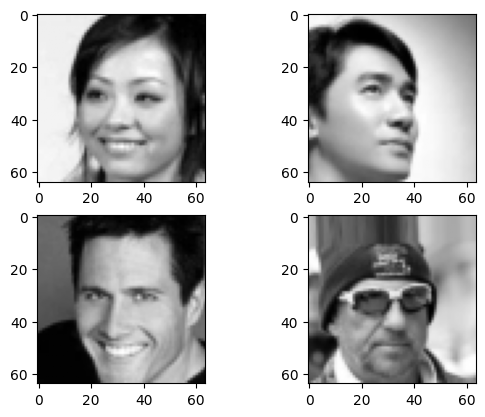

In [ ]:
for batch in train_loader:
    break

fig, axs = plt.subplots(2, 2)


imgplot = axs[0, 0].imshow(batch[0][1,0,:,:].numpy(),cmap='gray')
imgplot = axs[0, 1].imshow(batch[0][2,0,:,:].numpy(),cmap='gray')
imgplot = axs[1, 0].imshow(batch[0][3,0,:,:].numpy(),cmap='gray')
imgplot = axs[1, 1].imshow(batch[0][4,0,:,:].numpy(),cmap='gray')
plt.show()

# Autoencoder

Why to use all this complicated formulaes and regularizations, what is the need for variational inference? To analyze the difference, let's first train just an autoencoder on the data:

In [95]:
#!L
dimZ = 100  # Considering face reconstruction task, which size of representation seems reasonable?

# Define the decoder and encoder as networks with one hidden fc-layer
# (that means you will have 2 fc layers in each net)
# Use ReLU for hidden layers' activations
# GlorotUniform initialization for W
# Zero initialization for biases
# It's also convenient to put sigmoid activation on output layer to get nice normalized pics


class Autoencoder(nn.Module):
    
    def __init__(self, hidden_dim = 100, pic_dim = (64,64)):
        super(Autoencoder, self).__init__()

        self.pic_dim = pic_dim
        # TODO
        enc_linear1 = nn.Linear(pic_dim[0]*pic_dim[1],hidden_dim)
        w = enc_linear1.weight
        bais = enc_linear1.bias
        nn.init.xavier_uniform_(w,gain=nn.init.calculate_gain("relu"))
        nn.init.zeros_(bais)

        enc_linear2 = nn.Linear(hidden_dim,hidden_dim)
        w = enc_linear2.weight
        bais = enc_linear2.bias
        nn.init.xavier_uniform_(w,gain=1)
        nn.init.zeros_(bais)

        self.encoder = nn.Sequential(enc_linear1,nn.ReLU(),enc_linear2)

        dec_linear1 = nn.Linear(hidden_dim,hidden_dim)
        w = dec_linear1.weight
        bais = dec_linear1.bias
        nn.init.xavier_uniform_(w,gain=nn.init.calculate_gain("relu"))
        nn.init.zeros_(bais)

        dec_linear2 = nn.Linear(hidden_dim,pic_dim[0]*pic_dim[1])
        w = dec_linear2.weight
        bais = dec_linear2.bias
        nn.init.xavier_uniform_(w,gain=nn.init.calculate_gain("relu"))
        nn.init.zeros_(bais)

        self.decoder = nn.Sequential(dec_linear1,nn.ReLU(),dec_linear2,nn.Sigmoid())

    def forward(self, x):

        x = x.reshape((x.shape[0],-1))
        latent_code = self.encoder(x)
        reconstruction = self.decoder(latent_code)
        reconstruction = reconstruction.reshape((x.shape[0],1,self.pic_dim[0],self.pic_dim[1]))

        return reconstruction, latent_code

In [96]:
#!L
# Create MSE loss function
criterion = torch.nn.MSELoss()

autoencoder = Autoencoder().to(device)

# Use Adam optimizer
optimizer = optim.Adam(autoencoder.parameters())

epoch = 59


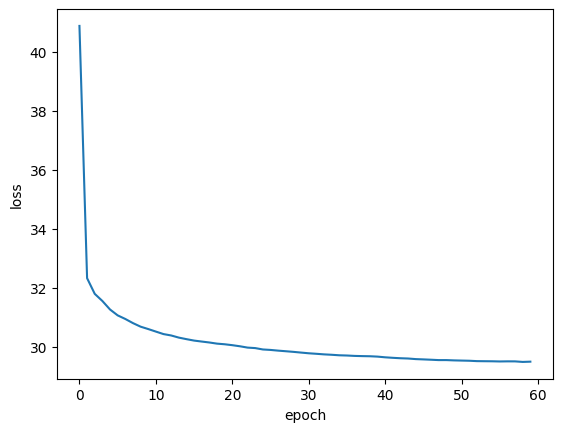

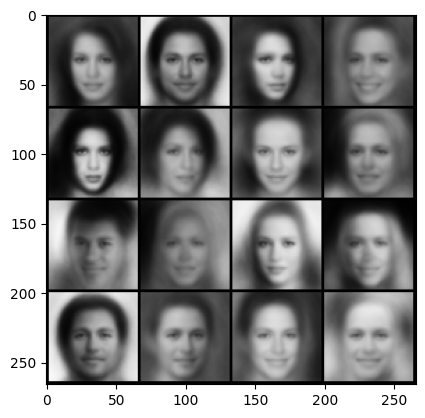

In [97]:
from itertools import islice
from IPython.display import clear_output
from tqdm import tqdm
#!L
# Train your autoencoder
# Visualize progress in reconstruction and loss decay

n_epoch = 60
hist = []
for epoch in range(n_epoch):
    hist.append(0)
    for batch in tqdm(train_loader):
        batch = batch[0]
        batch = batch.to(device)
        optimizer.zero_grad()
        reconstruction, latent_code = autoencoder(batch)
        loss = criterion(reconstruction,batch)
        loss.backward()
        optimizer.step()
        hist[-1]+=loss.item()

    clear_output()

    print(f"epoch = {epoch}")

    plt.plot(hist)
    plt.ylabel("loss")
    plt.xlabel("epoch")
    plt.show()

    images, _ = list(islice(val_loader, 1))[0]
    reconstruction, latent_code = autoencoder(images.to(device))

    reconstruction = reconstruction[:16].cpu()
    plt.imshow(make_grid(reconstruction, nrow=4).permute(1, 2, 0))
    plt.show()


Научили сетку. Нарисуем оригиналы и реконструкции. Вышло не слишком уж похоже, но пойдет.

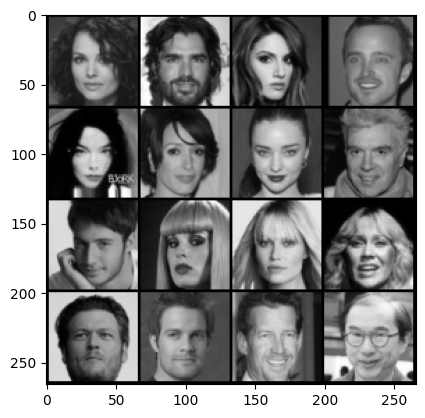

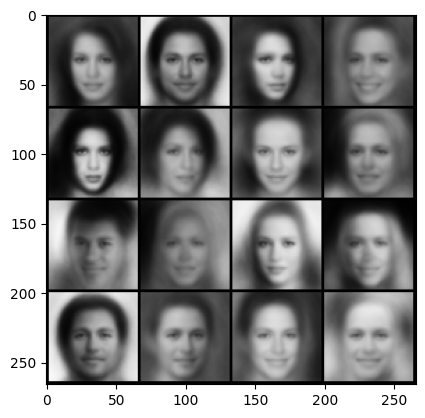

In [98]:
#!L
# Examine the reconstructions
from itertools import islice

images, _ = list(islice(val_loader, 1))[0]
reconstruction, latent_code = autoencoder(images.to(device))
plt.imshow(make_grid(images[:16], nrow=4).permute(1, 2, 0))
plt.show()
reconstruction = reconstruction[:16].cpu()
plt.imshow(make_grid(reconstruction, nrow=4).permute(1, 2, 0))
plt.show()

Reconstruction is not bad, right? 

Вышло ну так, но что-то работает.

# Sampling

Let's now sample several latent vectors and perform inference from $z$, reconstruct an image given some random $z$ representations.

In [19]:
reconstruction.shape

torch.Size([25, 4096])

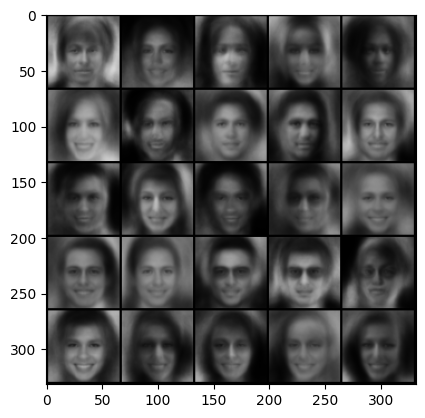

In [100]:
#!L
z = torch.randn(25, dimZ) 
reconstruction = autoencoder.decoder(z.to(device)).clamp(0, 1)
reconstruction = reconstruction.reshape((reconstruction.shape[0],1,64,64))
plt.imshow(make_grid(reconstruction.cpu(), nrow=5).permute(1, 2, 0))
plt.show()

So, if we sample $z$ from normal, whould we eventually generate all possible faces? What do you think?

# Variational Autoencoder

Bayesian approach in deep learning considers everything in terms of distributions. Now our encoder generates not just a vector $z$ but posterior ditribution $q(z|x)$. In our case distribution $q$ is Gaussian distibution $N(\mu, \sigma)$ with parameters $\mu$, $\sigma$. Technically, the first difference is that you need to split bottleneck layer in two. One dense layer will generate vector $\mu$, and another will generate vector $\sigma$. Reparametrization trick should be implemented using the **gaussian_sampler** layer, that generates random vetor $\epsilon$ and returns $\mu+\sigma\epsilon \sim N(\mu, \sigma)$ .

Since our decoder is also a function that generates distribution, we need to do the same splitting for output layer. When testing the model we will look only on mean values, so one of the output will be actual autoencoder output.

In [101]:
def make_layer(in_dim,out_dim,act = nn.ReLU()): #= nn.LeakyReLU(negative_slope=0.1)):

    module = nn.Linear(in_dim,out_dim,dtype=torch.float64)
    w = module.weight
    bais = module.bias
    if act == nn.ReLU():
        nn.init.xavier_uniform_(w,gain=nn.init.calculate_gain("relu"))
    elif act == nn.Tanh():
        nn.init.xavier_uniform_(w,gain=nn.init.calculate_gain("tanh")) 
    else:
        nn.init.xavier_uniform_(w,gain=1)
    nn.init.zeros_(bais)
    return nn.Sequential(module,act)   

In this homework we only ask for implementation of the simplest version of VAE - one $z$ sample per input. You can consider to sample several outputs from one input and average them.

In [ ]:
#!L
# to compare with conventional AE, keep these hyperparameters
# or change them for the values that you used before
dimZ = 100

# define the network
# you can start from https://github.com/pytorch/examples/blob/master/vae/main.py
# or Theano-based examples here https://github.com/Lasagne/Recipes/blob/master/examples/variational_autoencoder/variational_autoencoder.py
# and here https://github.com/y0ast/Variational-Autoencoder/blob/master/VAE.py
# but remember that this is not your ground truth since the data is not MNIST



class VAE(nn.Module):

    def __init__(self,hidden_dim = 100, pic_dim = (64,64)):
        super(VAE, self).__init__()

        self.pic_dim = pic_dim

        self.enc_linear1 = make_layer(pic_dim[0]*pic_dim[1],hidden_dim)
        self.enc_linear2 = make_layer(hidden_dim,hidden_dim)

        self.enc_linear3 = make_layer(pic_dim[0]*pic_dim[1],hidden_dim)
        self.enc_linear4 = make_layer(hidden_dim,hidden_dim) 
        self.enc_mu =  make_layer(hidden_dim,hidden_dim, act = nn.Identity())
        self.enc_logsigma = make_layer(hidden_dim,hidden_dim, act = nn.Identity()) 

        self.dec_linear1 = make_layer(hidden_dim,hidden_dim)
        self.dec_linear2 = make_layer(hidden_dim,hidden_dim)
        self.dec_linear3 = make_layer(hidden_dim,hidden_dim)
        self.dec_linear4 = make_layer(hidden_dim,hidden_dim)           
        self.dec_mu = make_layer(hidden_dim,pic_dim[0]*pic_dim[1],act = nn.Sigmoid())
        self.dec_logsigma = make_layer(hidden_dim,pic_dim[0]*pic_dim[1],act = nn.Identity()) 


    def gaussian_sampler(self, mu, logsigma):
        noise = torch.randn_like(mu)
        return noise * logsigma.exp() + mu
    
    def encoder(self,x):

        x = x.reshape((x.shape[0],-1))
    
        x1 = self.enc_linear1(x)
        x1 = self.enc_linear2(x1)
        mu_z = self.enc_mu(x1)

        
        x2 = self.enc_linear3(x)
        x2 = self.enc_linear4(x2)
        logsigma_z = 1*self.enc_logsigma(x2)

        # добавил клиппинг логсигмы чтобы обучение не уходило в наны
        ones = -3 * torch.ones_like(logsigma_z)
        logsigma_z = torch.max(logsigma_z,ones)

        return mu_z, logsigma_z
    
    def decoder(self,z):

        z1 = self.dec_linear1(z)
        z1 = self.dec_linear2(z1)
        mu_gen = self.dec_mu(z1)

        z2 = self.dec_linear3(z)
        z2 = self.dec_linear4(z2)
        logsigma_gen =  self.dec_logsigma(z2)
        # добавил клиппинг логсигмы чтобы обучение не уходило в наны
        ones = -3 * torch.ones_like(logsigma_gen)
        logsigma_gen = torch.max(logsigma_gen,ones)

        mu_gen = mu_gen.reshape((z.shape[0],1,self.pic_dim[0],self.pic_dim[1]))
        logsigma_gen = logsigma_gen.reshape((z.shape[0],1,self.pic_dim[0],self.pic_dim[1]))
        return mu_gen, logsigma_gen

    def forward(self, x):

        mu_z, logsigma_z = self.encoder(x)
        z = self.gaussian_sampler(mu_z,logsigma_z)
        mu_gen, logsigma_gen = self.decoder(z)
        
        return mu_gen, logsigma_gen, mu_z, logsigma_z

And the last, but not least! Place in the code where the most of the formulaes goes to - optimization objective. The objective for VAE has it's own name - variational lowerbound. And as for any lowerbound our intention is to maximize it. Here it is (for one sample $z$ per input $x$):

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z) \to max$$

Your next task is to implement two functions that compute KL-divergence and the second term - log-likelihood of an output. Here is some necessary math for your convenience:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$
$$\log p_{\theta}(x|z) = \sum_{i=1}^{dimX}\log p_{\theta}(x_i|z)=\sum_{i=1}^{dimX} \log \Big( \frac{1}{\sigma_i\sqrt{2\pi}}e^{-\frac{(\mu_i-x)^2}{2\sigma_i^2}} \Big)=...$$

Don't forget in the code that you are using $\log\sigma$ as variable. Explain, why not $\sigma$?

In [107]:
#!L
def KL_divergence(mu, logsigma):
    return -0.5*torch.sum(1+2*logsigma-mu**2-(2*logsigma).exp())


def log_likelihood(x, mu, logsigma):
    return torch.sum(torch.log(torch.exp(-(mu-x).pow(2)/(2*(2*logsigma).exp()))/(logsigma.exp()*(2*torch.pi)**0.5)))


def loss_vae(x, mu_gen, logsigma_gen, mu_z, logsigma_z):
    kl_loss = -KL_divergence(mu_z,logsigma_z)
    lk_loss =log_likelihood(x,mu_gen,logsigma_gen)
    loss = kl_loss+lk_loss
    return loss, kl_loss.item(), lk_loss.item()

And train the model:

In [114]:
vae = VAE().to(device)

# Use Adam optimizer
optimizer = optim.Adam(vae.parameters(),maximize = True,lr=1e-3)

In [141]:
for batch in train_loader:
    break

epoch = 59


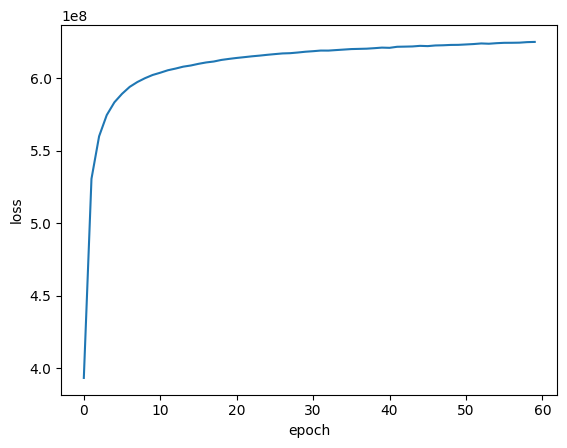

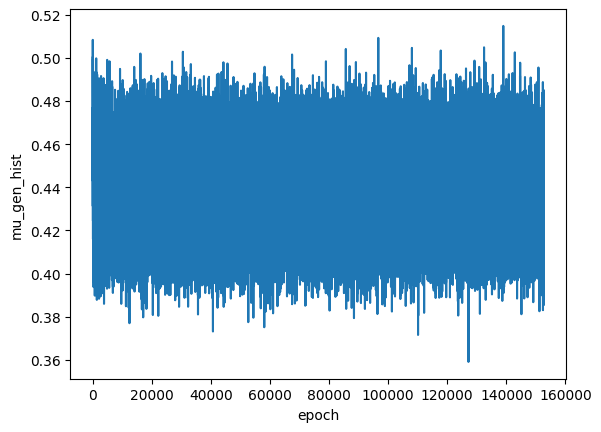

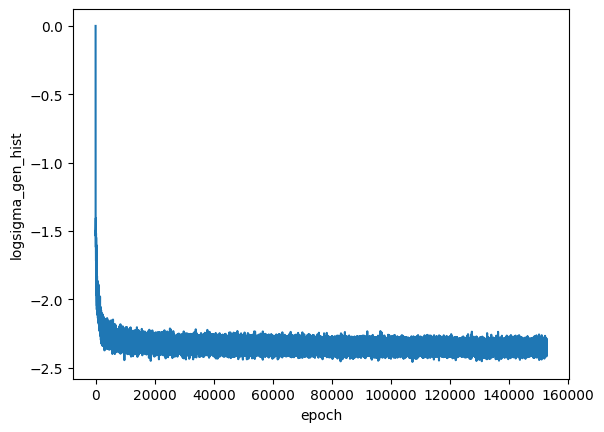

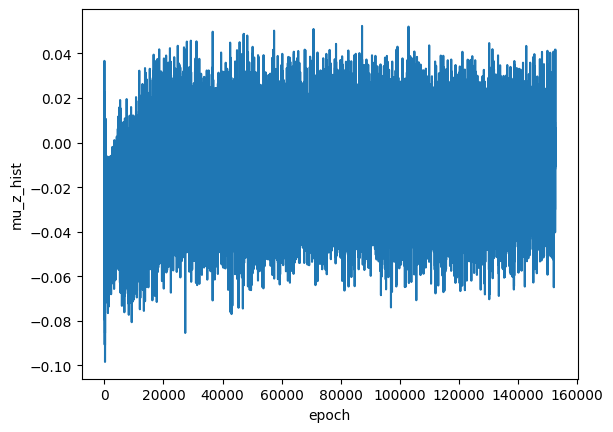

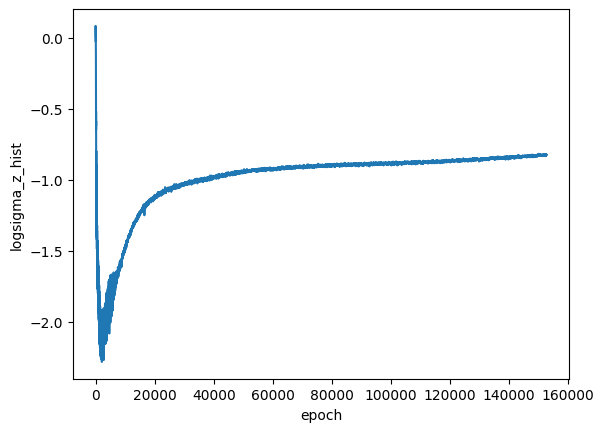

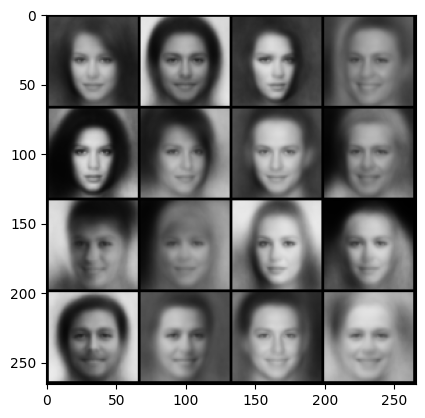

In [ ]:
from itertools import islice
from IPython.display import clear_output
from tqdm import tqdm
#!L
# Train your autoencoder
# Visualize progress in reconstruction and loss decay

n_epoch = 60

# будем запоминать статистики по разным компонентам лоса и так же средние по mu_gen, logsigma_gen, mu_z, logsigma_z
hist = []
hist_kl = []
hist_lk = []

mu_z_hist = []
logsigma_z_hist = []
mu_gen_hist = []
logsigma_gen_hist = []

for epoch in range(n_epoch):
    hist.append(0)
    hist_kl.append(0)
    hist_lk.append(0)


    for batch in tqdm(train_loader):
        batch = batch[0]
        batch = batch.double()
        batch = batch.to(device)
        
        optimizer.zero_grad()
        mu_gen, logsigma_gen, mu_z, logsigma_z = vae(batch)
        loss, kl_loss, lk_loss = loss_vae(batch,mu_gen, logsigma_gen, mu_z, logsigma_z)
        loss.backward()
        optimizer.step()
        hist[-1]+=loss.item()
        hist_kl[-1] += kl_loss
        hist_lk[-1] += lk_loss

        mu_gen_hist.append(torch.mean(mu_gen).item())
        logsigma_gen_hist.append(torch.mean(logsigma_gen).item())
        mu_z_hist.append(torch.mean(mu_z).item())
        logsigma_z_hist.append(torch.mean(logsigma_z).item())


    clear_output()

    print(f"epoch = {epoch}")

    plt.plot(hist)
    plt.ylabel("loss")
    plt.xlabel("epoch")
    plt.show()

    plt.plot(mu_gen_hist)
    plt.ylabel("mu_gen_hist")
    plt.xlabel("epoch")
    plt.show()
    plt.plot(logsigma_gen_hist)
    plt.ylabel("logsigma_gen_hist")
    plt.xlabel("epoch")
    plt.show()
    plt.plot(mu_z_hist)
    plt.ylabel("mu_z_hist")
    plt.xlabel("epoch")
    plt.show()
    plt.plot(logsigma_z_hist)
    plt.ylabel("logsigma_z_hist")
    plt.xlabel("epoch")
    plt.show()

    images, _ = list(islice(val_loader, 1))[0]
    mu_gen, _, _, _ = vae(images.double().to(device))
    reconstruction = mu_gen[:16].cpu().clamp(0, 1)

    plt.imshow(make_grid(reconstruction, nrow=4).permute(1, 2, 0))
    plt.show()

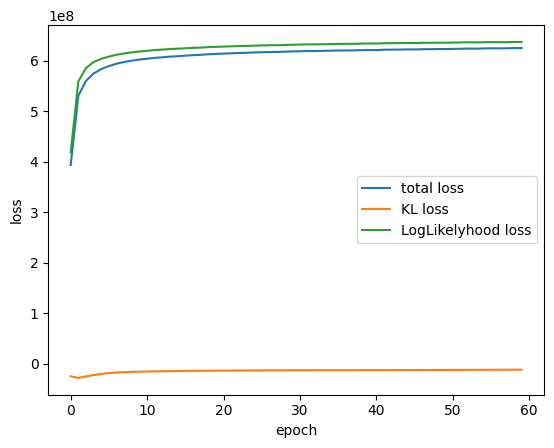

In [129]:
plt.plot(hist,label = "total loss")
plt.plot(hist_kl,label = "KL loss")
plt.plot(hist_lk,label = "LogLikelyhood loss")
plt.legend()
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

Научили сетку. Нарисуем оригиналы и реконструкции. Вышло не слишком уж похоже, но пойдет.

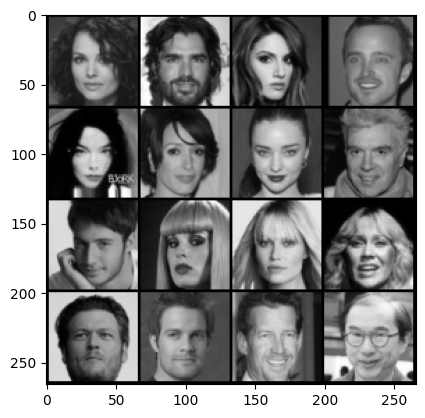

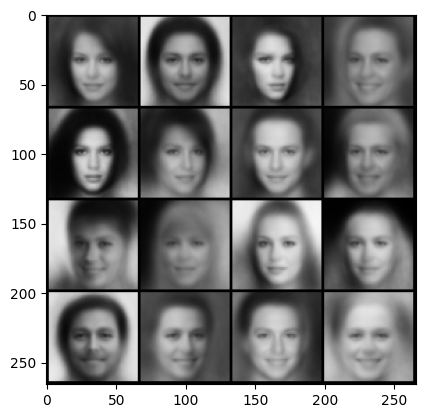

In [117]:
#!L
from itertools import islice
images, _ = list(islice(val_loader, 1))[0]
plt.imshow(make_grid(images[:16], nrow=4).permute(1, 2, 0))
plt.show()
mu_gen, _, _, _ = vae(images.double().to(device))
reconstruction = mu_gen[:16].cpu().clamp(0, 1)

plt.imshow(make_grid(reconstruction, nrow=4).permute(1, 2, 0))
plt.show()

And finally sample from VAE.

With noice


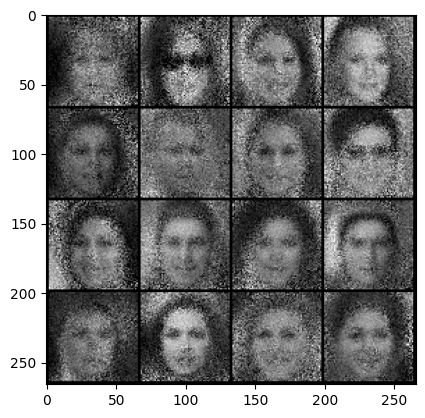

Without noice


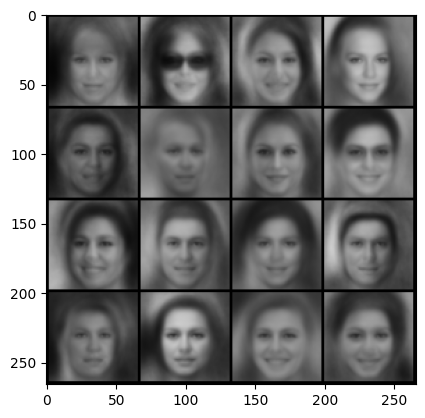

In [124]:
z = torch.randn((16,100),dtype=torch.float64)
z = z.to(device)

mu_gen,logsigma_gen  = vae.decoder(z)
noise = torch.randn_like(mu_gen)
x_gen = mu_gen + noise*logsigma_gen.exp()
x_gen = x_gen.reshape((16,1,64,64))

reconstruction = x_gen.cpu().clamp(0, 1)
print("With noice")
plt.imshow(make_grid(reconstruction, nrow=4).permute(1, 2, 0))
plt.show()

print("Without noice")

x_gen = mu_gen
x_gen = x_gen.reshape((16,1,64,64))
reconstruction = x_gen.cpu().clamp(0, 1)
plt.imshow(make_grid(reconstruction, nrow=4).permute(1, 2, 0))
plt.show()

Видно что шума больше на фоне, и что шум достаточно сильно искажает картинку.

Even if in practice you do not see the much difference between AE and VAE, or VAE is even worse, the little bayesian inside you should be jumping for joy right now. 

In VAE you can truly sample from image distribution $p(x)$, while in AE there is no easy and correct way to do it. 

#### Замечание.

Сначала у меня разваливалось обучение потому что при малых дисперсиях лосы уходили в NaN. Я пробовал делать клиппинг, или использовать Tanh на выходе слоя с logsigma. В итоге помогло переписывание всего через float64.

# Congrats! and Bonus

If you managed to tune your autoencoders to converge and learn something about the world, now it's time to make fun out of it. As you may have noticed, there are face attributes in dataset. We're interesting in "Smiling" column (index 31 of the attribute vector), but feel free to try others as well! Here is the first task:

1) Extract the "Smilling" attribute and create a two sets of images: 10 smiling faces and 10 non-smiling ones.

2) Compute latent representations for each image in "smiling" set and average those latent vectors. Do the same for "non-smiling" set. You have found **"vector representation"** of the "smile" and "no smile" attribute.

3) Compute the difference: "smile" vector minus "non-smile" vector.

3) Now check if **"feature arithmetics"** works. Sample a face without smile, encode it and add the diff from p. 3. Check if it works with both AE and VAE. 

<img src="linear.png" alt="linear">

In [228]:
non_smiling = torch.ones((10,1,64,64))
smiling = torch.ones((10,1,64,64))
ns_counter = 0
s_counter = 0
for batch in train_loader:
    features = batch[1]
    for i in range(64):
        if features[i][31] == 1 and s_counter < 10:
            smiling[s_counter] = batch[0][i]
            s_counter += 1
        elif features[i][31] == 0 and ns_counter < 10:
            non_smiling[ns_counter] = batch[0][i]
            ns_counter += 1
    if s_counter == 10 and ns_counter == 10:
        break

In [229]:
non_smiling = non_smiling.to(device)
smiling = smiling.to(device)

Encoder

In [230]:
non_smiling = non_smiling.reshape((non_smiling.shape[0],-1))
smiling = smiling.reshape((smiling.shape[0],-1))
nonsmile_z = autoencoder.encoder(non_smiling)
smile_z = autoencoder.encoder(smiling)
nonsmile_z = torch.mean(nonsmile_z,dim = 0)
smile_z = torch.mean(smile_z,dim = 0)
smile_vec = smile_z-nonsmile_z

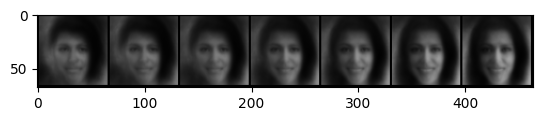

In [243]:
#!L
z = torch.randn(1, dimZ,device=device) 
z = torch.repeat_interleave(z,7,dim = 0)
vec = torch.linspace(-1,1,7,device=device)[:,None]*smile_vec[None,:]
z = z+ vec
reconstruction = autoencoder.decoder(z.to(device)).clamp(0, 1)
reconstruction = reconstruction.reshape((reconstruction.shape[0],1,64,64))
plt.imshow(make_grid(reconstruction.cpu(), nrow=7).permute(1, 2, 0))
plt.show()

VAE

In [221]:
nonsmile_z = vae.encoder(non_smiling.double())
smile_z = vae.encoder(smiling.double())
nonsmile_z = torch.mean(nonsmile_z[0],dim = 0)
smile_z = torch.mean(smile_z[0],dim = 0)
smile_vec = smile_z-nonsmile_z

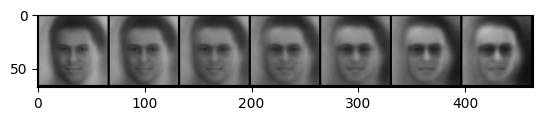

In [227]:
z = torch.randn((1,100),dtype=torch.float64,device=device)
z = torch.repeat_interleave(z,7,dim = 0)
z = z.to(device)
vec = torch.linspace(-1,1,7,device=device)[:,None]*smile_vec[None,:]
vec = vec.double()

mu_gen,logsigma_gen  = vae.decoder(z+vec)

x_gen = mu_gen
x_gen = x_gen.reshape((7,1,64,64))
reconstruction = x_gen.cpu().clamp(0, 1)
plt.imshow(make_grid(reconstruction, nrow=7).permute(1, 2, 0))
plt.show()